In [ ]:
from obspy import read
from scipy.signal import spectrogram
import matplotlib.pyplot as plt
import numpy as np

# Leer traza
st = read("../data/raw/VT/2018-03-04-0320-13S.LC05__001_00_01")
st.spectrogram(log=True, title='BW.RJOB ' + str(st[0].stats.starttime), outfile='spectrogram.png')


c:\Users\nicol\anaconda3\envs\volcan-seismic\Lib\site-packages\obspy\core\util\base.py:26: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  import pkg_resources


Procesando carpeta: HY (213 archivos)


Archivos HY: 100%|██████████| 213/213 [00:00<00:00, 2927.34arch/s]


Procesando carpeta: LP (577 archivos)


Archivos LP: 100%|██████████| 577/577 [00:00<00:00, 4151.21arch/s]


Procesando carpeta: TC (2198 archivos)


Archivos TC: 100%|██████████| 2198/2198 [00:00<00:00, 3905.62arch/s]


Procesando carpeta: TR (471 archivos)


Archivos TR: 100%|██████████| 471/471 [00:00<00:00, 6326.31arch/s]


Procesando carpeta: VT (2686 archivos)


Archivos VT:   6%|▌         | 152/2686 [00:07<03:20, 12.61arch/s]c:\Users\nicol\anaconda3\envs\volcan-seismic\Lib\site-packages\obspy\imaging\spectrogram.py:159: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure()
Archivos VT: 100%|██████████| 2686/2686 [15:45<00:00,  2.84arch/s]


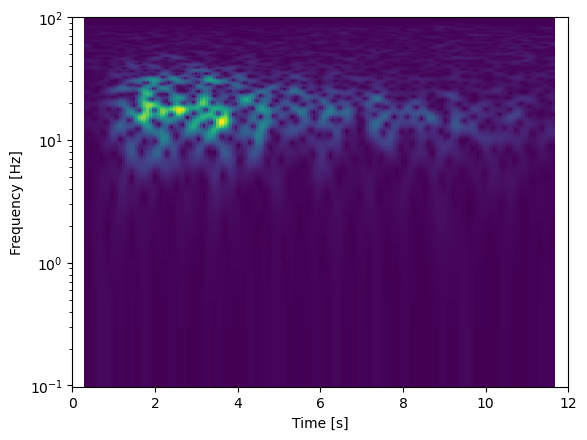

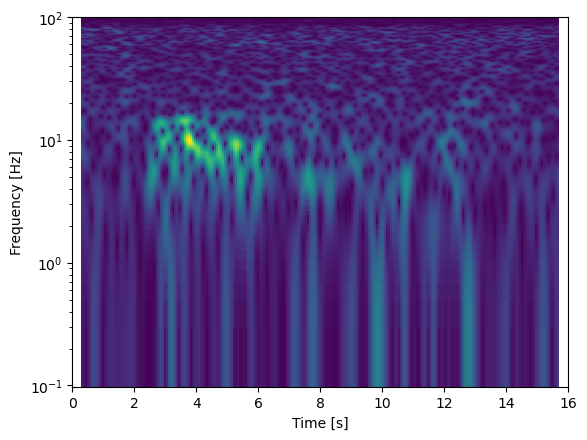

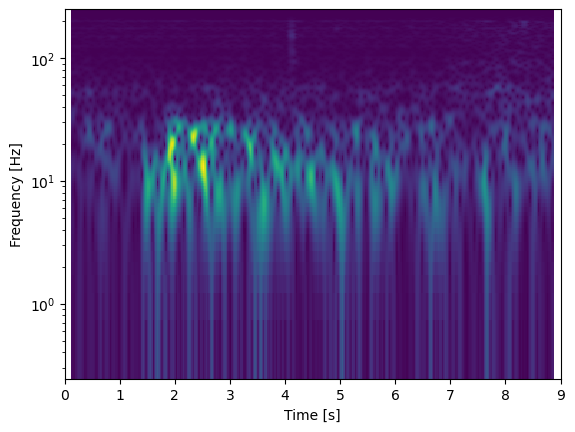

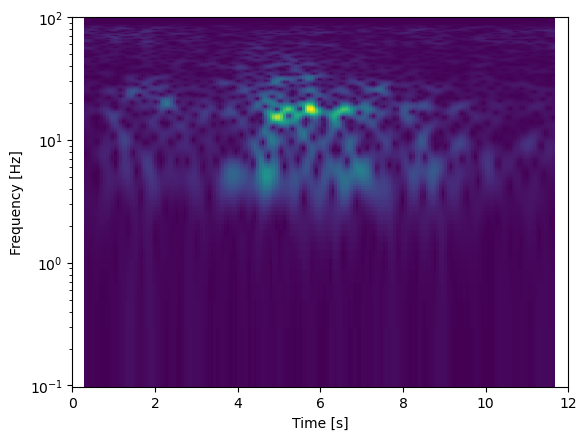

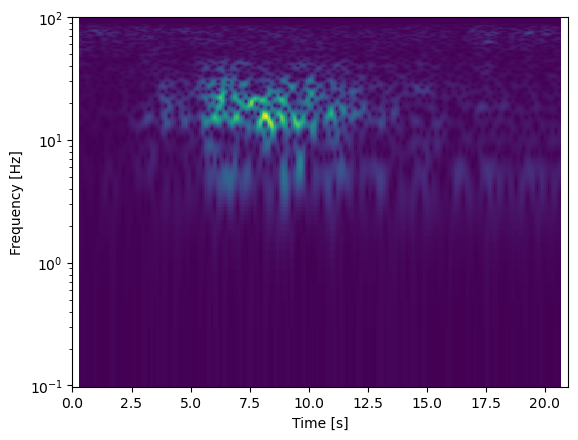

...

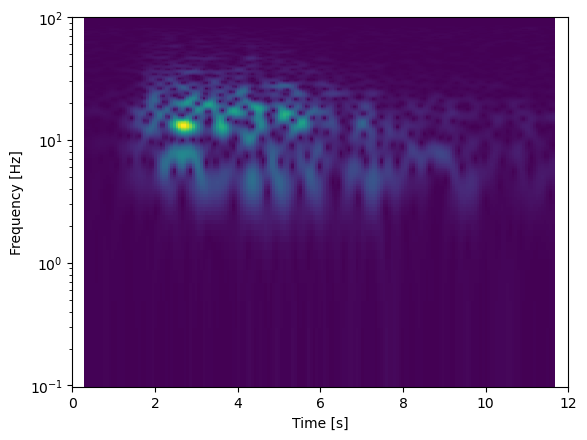

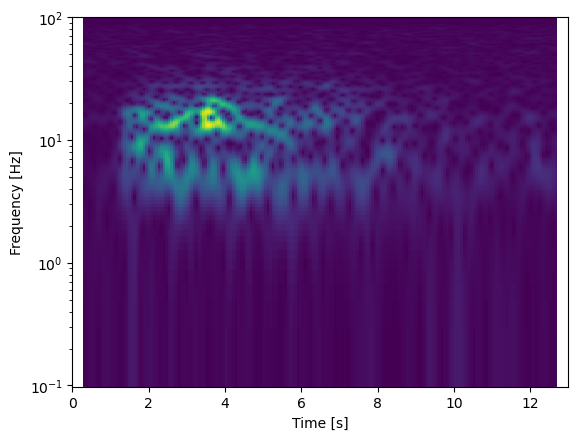

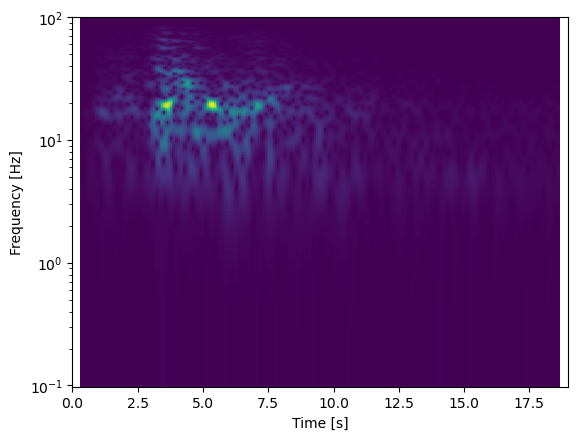

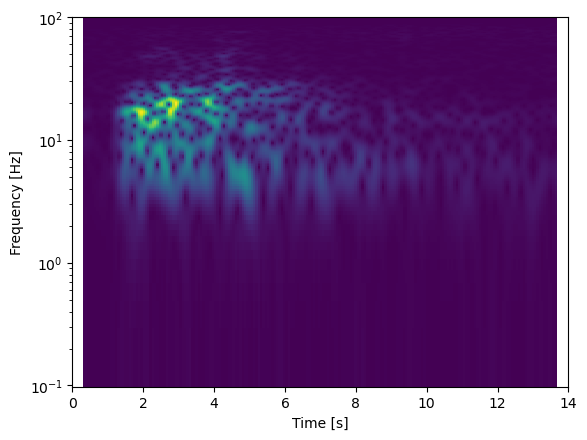

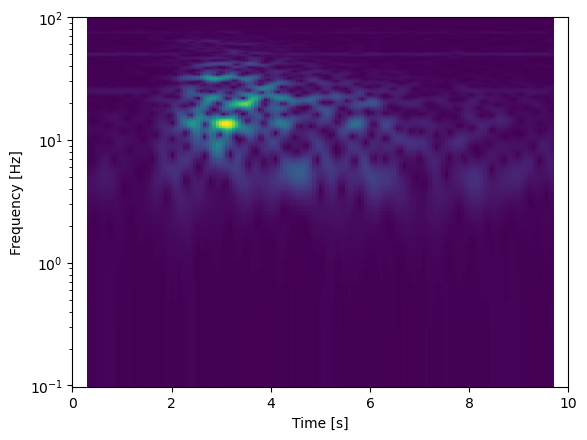

Error in callback <function flush_figures at 0x000002503E5C2160> (for post_execute), with arguments args (),kwargs {}:


KeyboardInterrupt: 

In [1]:
import os
from obspy import read
from tqdm import tqdm

base_path = "../data/raw"
output_base = "../data/processed/spectro"
folders = ['HY', 'LP', 'TC', 'TR', 'VT']

for folder in folders:
    folder_path = os.path.join(base_path, folder)
    output_folder = os.path.join(output_base, folder)
    os.makedirs(output_folder, exist_ok=True)

    files = [f for f in os.listdir(folder_path) if f.endswith(".SAC") or "__" in f]

    print(f"Procesando carpeta: {folder} ({len(files)} archivos)")

    for filename in tqdm(files, desc=f"Archivos {folder}", unit="arch"):
        input_path = os.path.join(folder_path, filename)
        output_file = os.path.join(output_folder, os.path.splitext(filename)[0] + ".png")

        if os.path.exists(output_file):
            # Ya existe la imagen, se salta
            continue

        try:
            st = read(input_path)
            st.spectrogram(log=True, title="", outfile=output_file)
        except Exception as e:
            print(f"Error con {filename}: {e}")
